# Training

## - Import

In [4]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
from PIL import Image
import random
import io
import imageio

from tensorflow import keras
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, LeakyReLU, Dropout, Input, Conv2DTranspose, Layer, Concatenate, UpSampling2D, Flatten, Dense
from keras.initializers import RandomNormal
from keras.models import Sequential, Model, load_model
from keras.datasets import mnist
from keras.optimizers import Adam, RMSprop
from keras.applications import VGG19

import warnings
warnings.filterwarnings("ignore")

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## - Helping functions

In [ ]:
# function which will add noise for all images in dataset
def add_noise(dataset, max_disp):
    noise = np.random.uniform(0, max_disp, (len(dataset), 28, 28, 1))
    dataset = (dataset + noise) / (1 + max_disp)
    return dataset

#function to show images
def show_images(examples, n):
    for i in range(n * n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i])
    plt.show()

## - Constants

In [ ]:
max_disp = 1
steps = 4
__datasets__ = []
list_of_models = []
list_of_con_models = []
__list_of_gans__ = []
epochs = 30
batch_size = 256
base_path = 'drive/MyDrive/weights_for_denoiser/'

## - Prepare dataset

len dataset: 5000
digit 0, dataset number 0


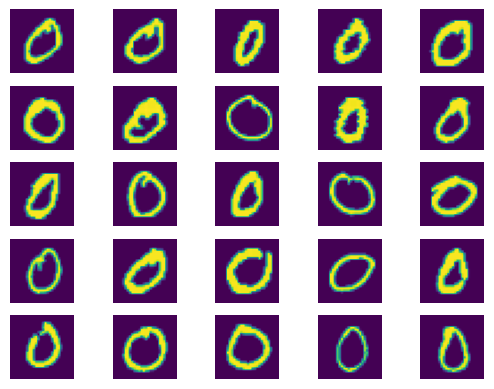

digit 0, dataset number 1


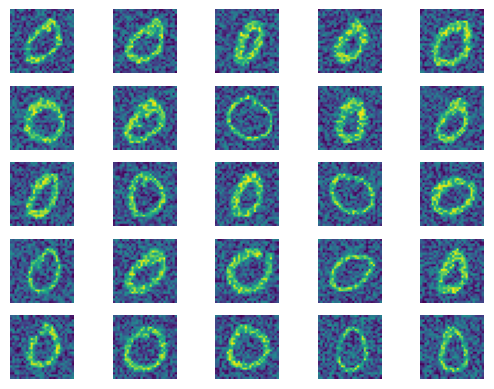

digit 0, dataset number 2


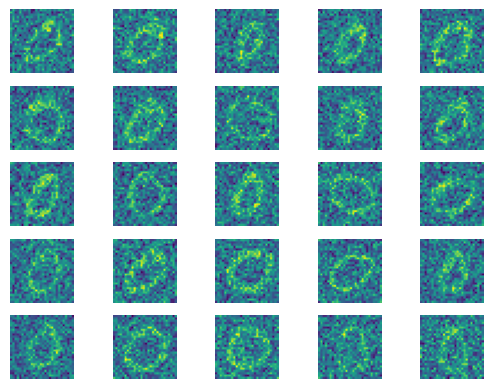

digit 0, dataset number 3


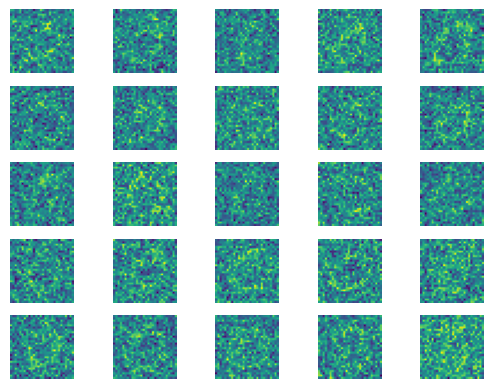

digit 0, dataset number 4


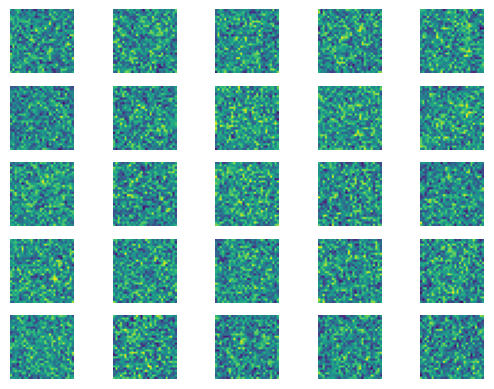

len dataset: 5000
digit 1, dataset number 0


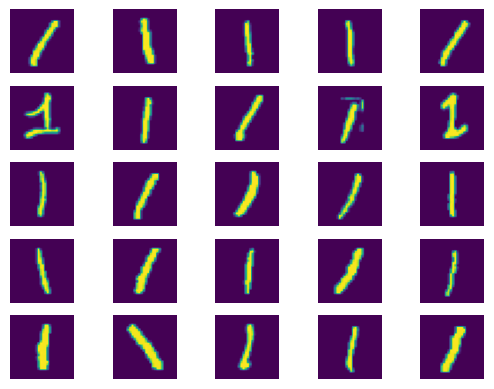

digit 1, dataset number 1


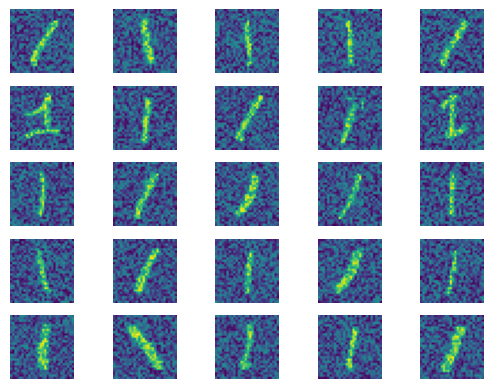

digit 1, dataset number 2


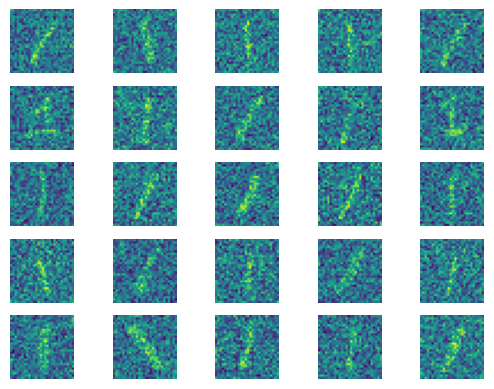

digit 1, dataset number 3


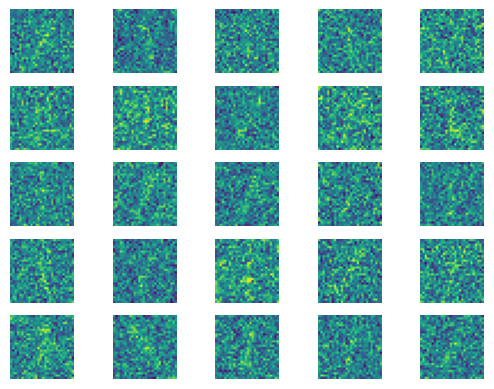

digit 1, dataset number 4


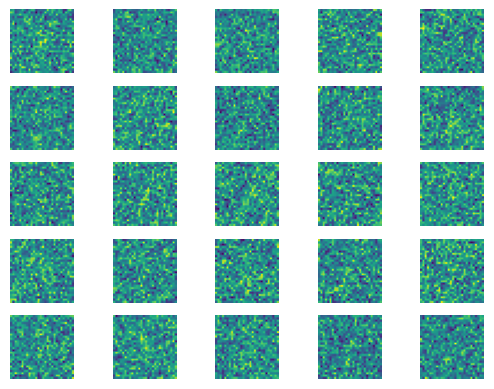

len dataset: 5000
digit 2, dataset number 0


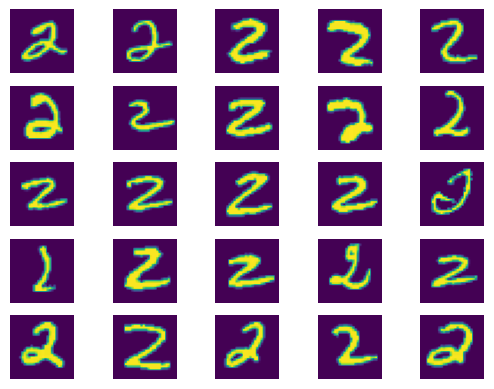

digit 2, dataset number 1


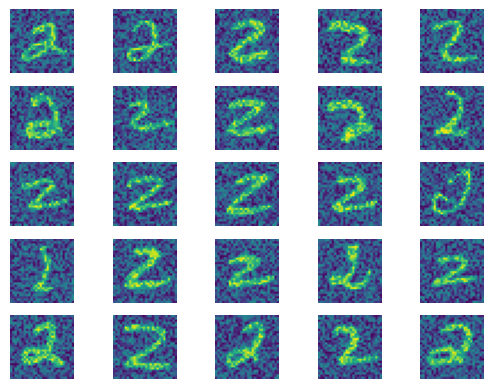

digit 2, dataset number 2


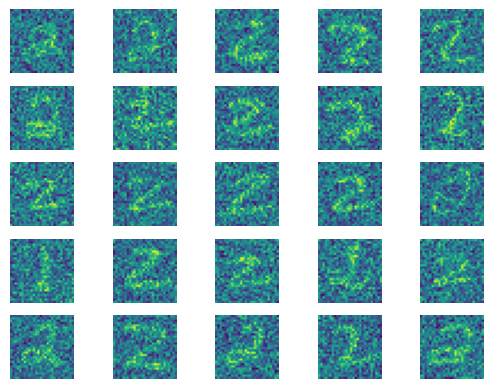

digit 2, dataset number 3


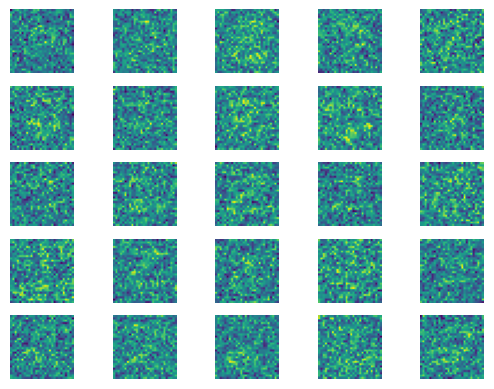

digit 2, dataset number 4


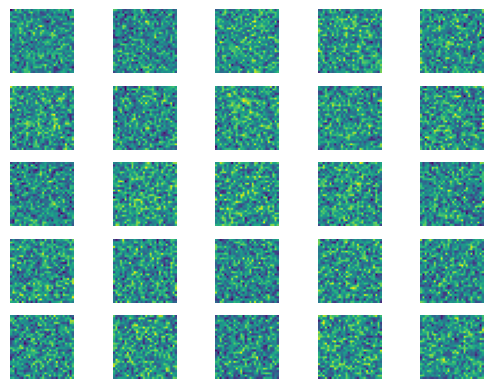

len dataset: 5000
digit 3, dataset number 0


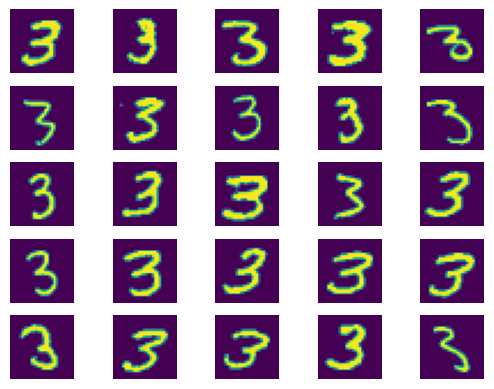

digit 3, dataset number 1


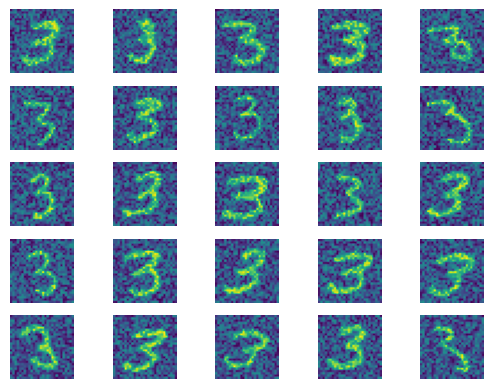

digit 3, dataset number 2


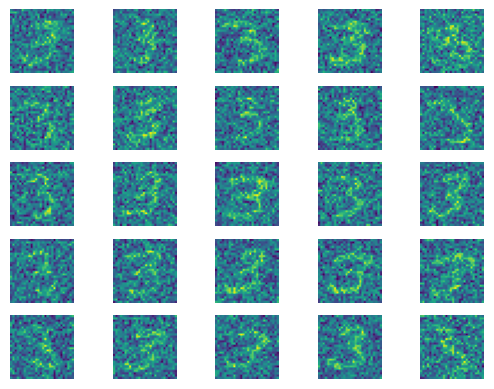

digit 3, dataset number 3


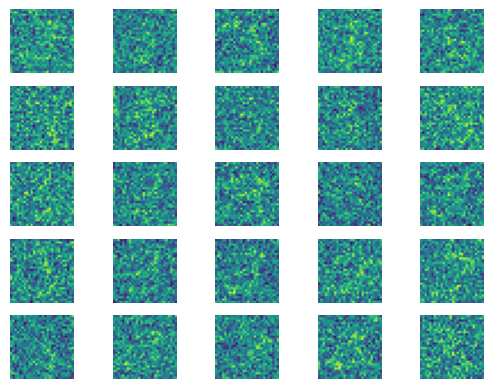

digit 3, dataset number 4


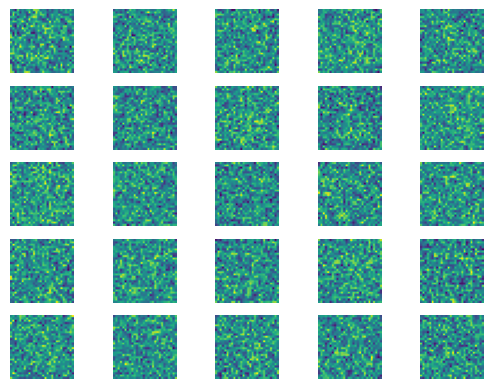

len dataset: 5000
digit 4, dataset number 0


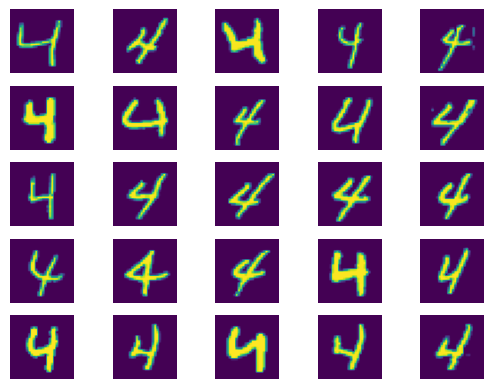

digit 4, dataset number 1


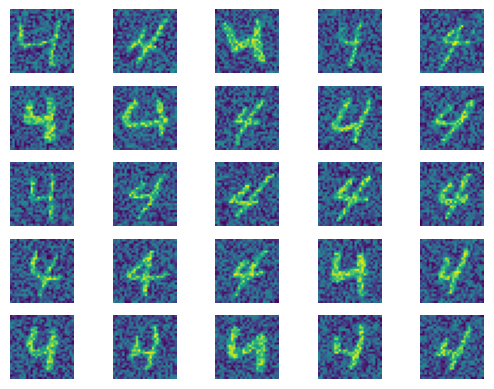

digit 4, dataset number 2


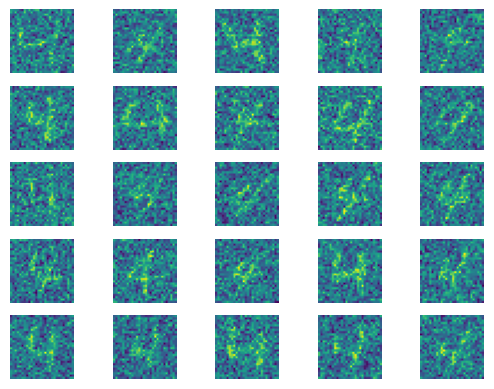

digit 4, dataset number 3


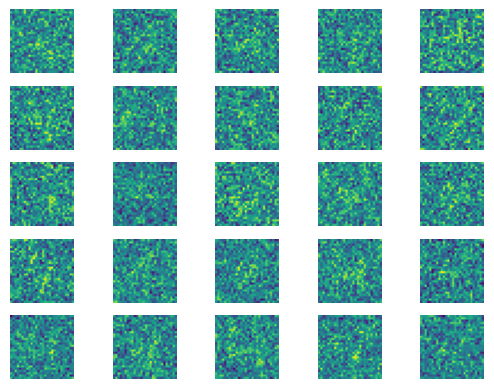

digit 4, dataset number 4


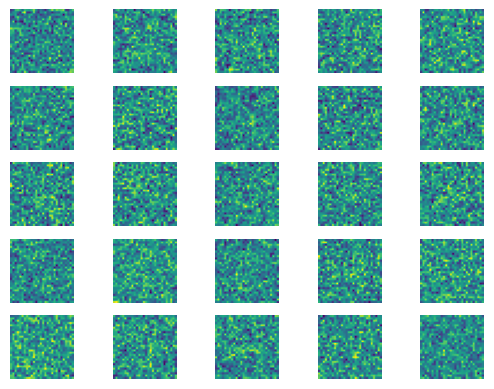

len dataset: 5000
digit 5, dataset number 0


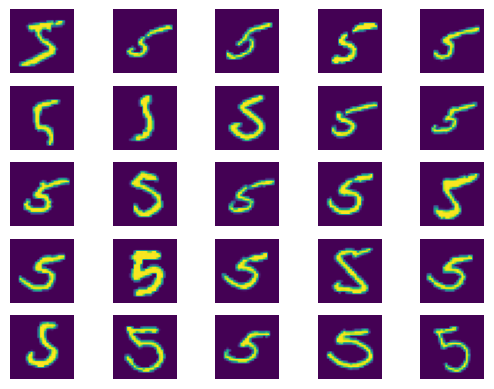

digit 5, dataset number 1


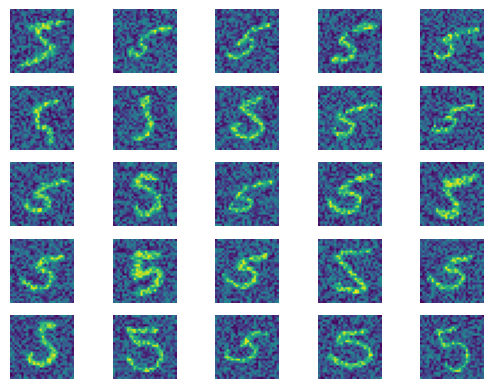

digit 5, dataset number 2


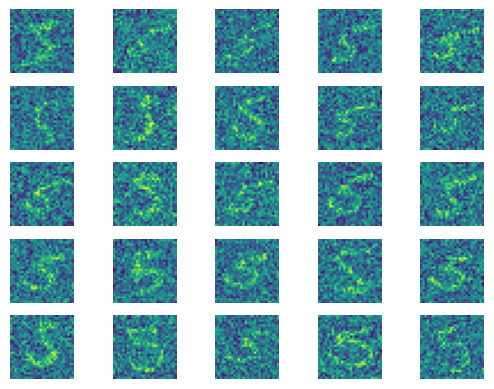

digit 5, dataset number 3


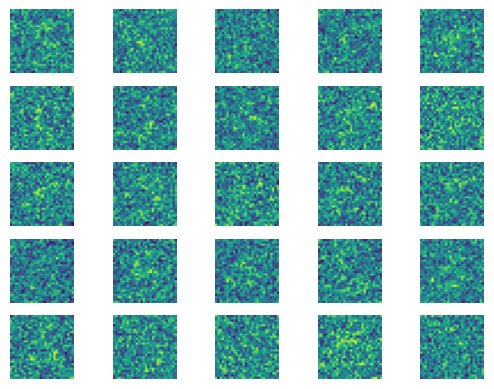

digit 5, dataset number 4


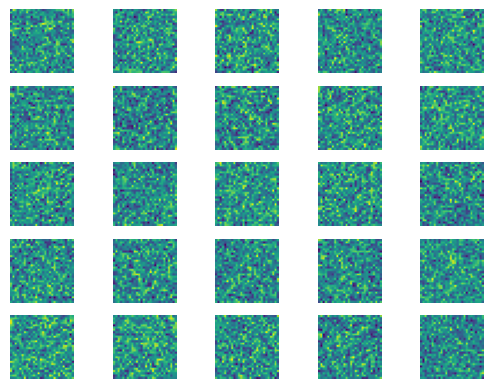

len dataset: 5000
digit 6, dataset number 0


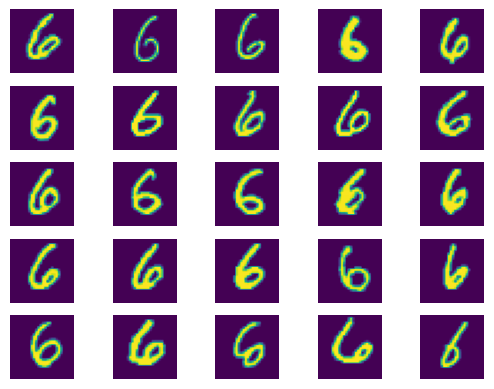

digit 6, dataset number 1


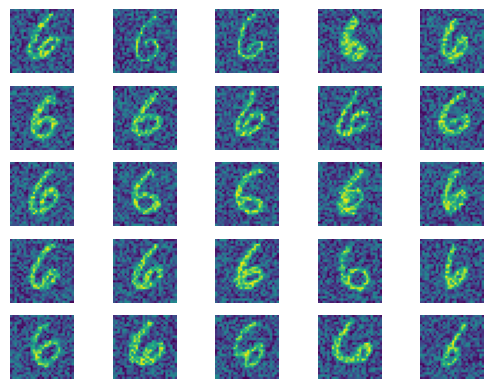

digit 6, dataset number 2


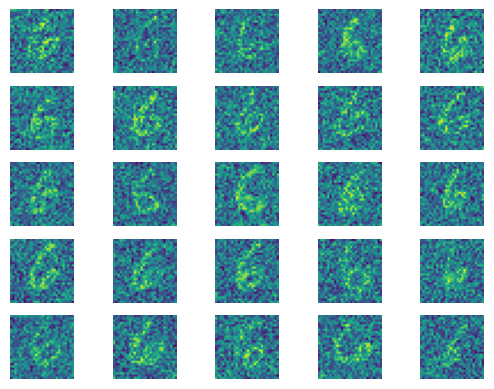

digit 6, dataset number 3


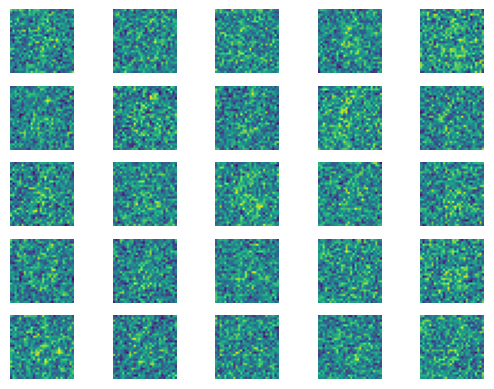

digit 6, dataset number 4


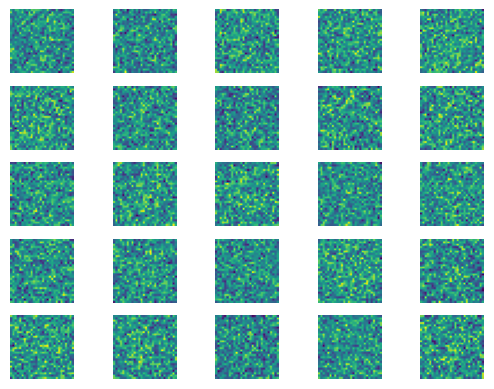

len dataset: 5000
digit 7, dataset number 0


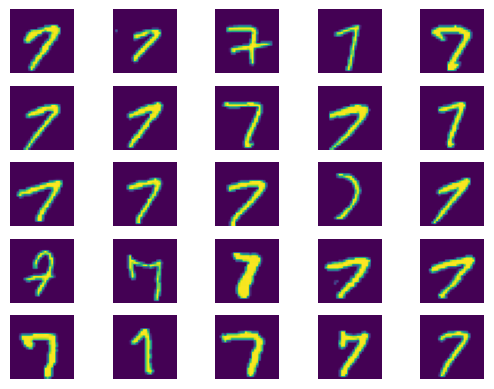

digit 7, dataset number 1


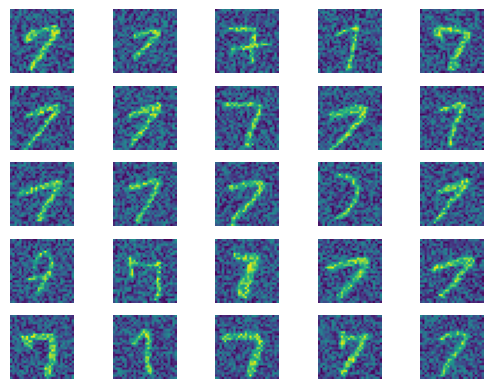

digit 7, dataset number 2


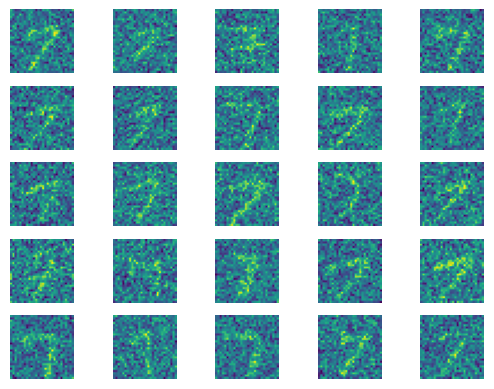

digit 7, dataset number 3


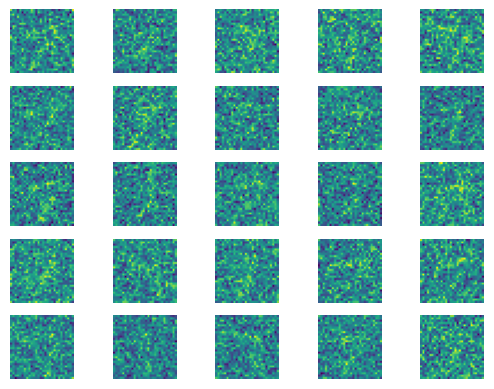

digit 7, dataset number 4


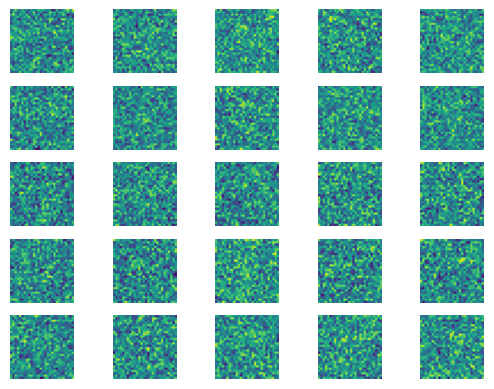

len dataset: 5000
digit 8, dataset number 0


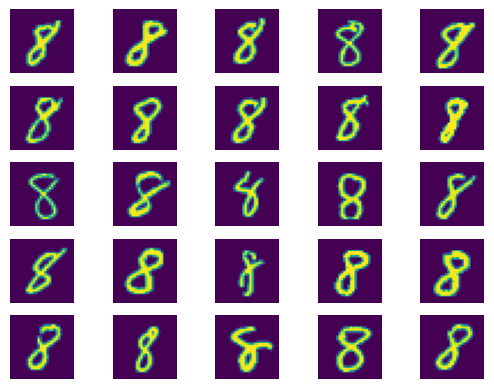

digit 8, dataset number 1


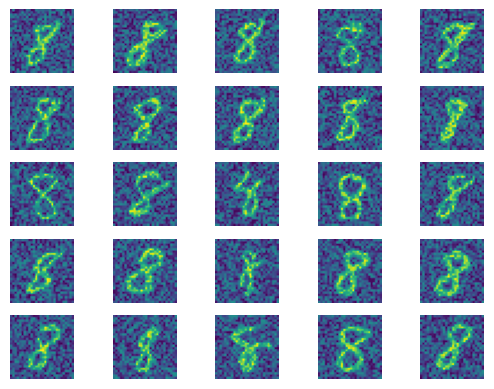

digit 8, dataset number 2


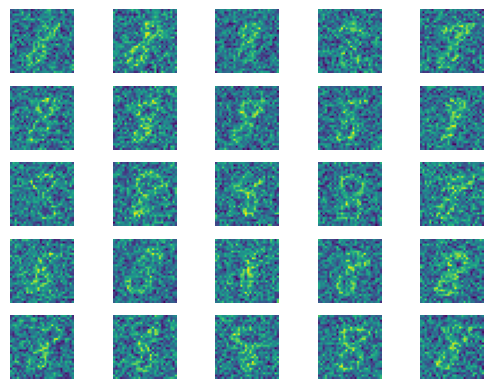

digit 8, dataset number 3


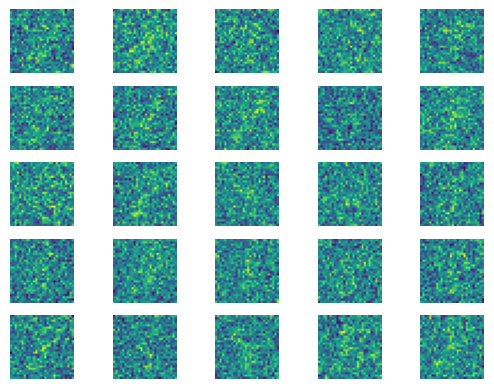

digit 8, dataset number 4


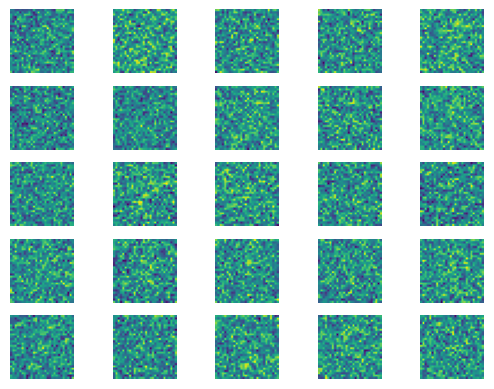

len dataset: 5000
digit 9, dataset number 0


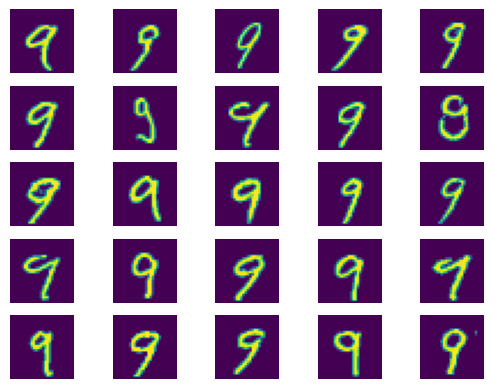

digit 9, dataset number 1


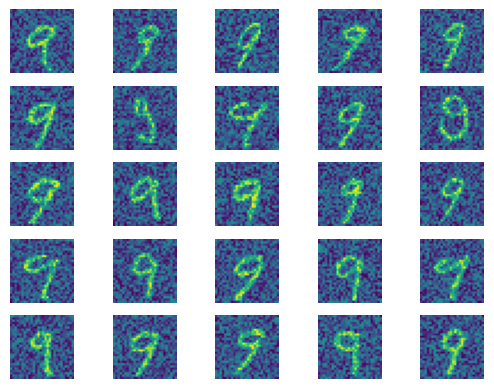

digit 9, dataset number 2


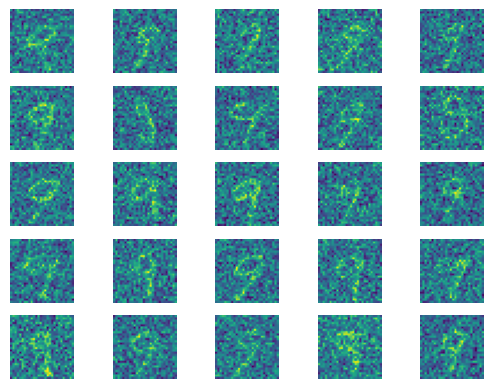

digit 9, dataset number 3


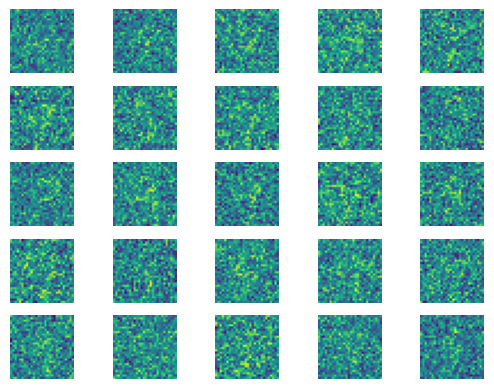

digit 9, dataset number 4


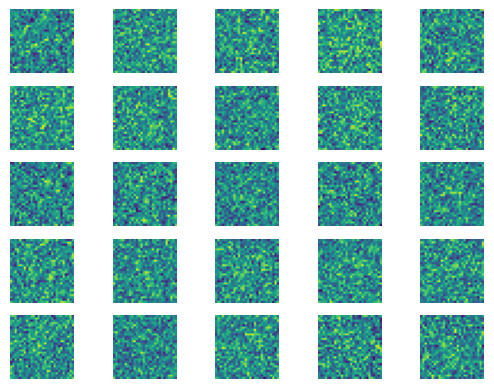

In [3]:
# create dataset "datasets" from noisy images
for q in range(10):
    (x_train, y_train), (_, _) = mnist.load_data()
    x_train = x_train[[y_train[i] == q for i in range(len(y_train))]][:5000].astype('float32') / 255.0
    x_train = np.expand_dims(x_train, axis=[0, -1])
    dataset = x_train.copy()
    dataset = dataset
    for i in range(steps):
        per = add_noise(dataset[i], max_disp)
        per = np.expand_dims(per, axis=0)
        dataset = np.concatenate((dataset, per), axis=0)

    # look at noisy images from "datasets"
    print(f'len dataset: {len(dataset[0])}')
    for i in range(steps+1):
        print(f'digit {q}, dataset number {i}')
        show_images(dataset[i], 5)

    __datasets__.append(dataset)

__datasets__ = np.stack(__datasets__)

In [4]:
__datasets__.shape

(10, 5, 5000, 28, 28, 1)

## - Denoiser model

In [5]:
# define denoiser
def create_denoiser():
    model = Sequential([
        Input(shape=(28, 28, 1)),
        Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (3, 3), activation='relu', padding='same'),

        Conv2DTranspose(64, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(64, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(128, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(1, (7, 7), padding='same', activation='sigmoid'),
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# create list of denoisers
for i in range(10):
    models = [create_denoiser() for _ in range(steps)]
    list_of_models.append(models)

list_of_models = np.stack(list_of_models)
list_of_models[0][0].summary()
print(f'shape list_of_models: {list_of_models.shape}')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 128)       2176      
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 128)       0         
                                                                 
 dropout (Dropout)           (None, 14, 14, 128)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 64)          131136    
                                                                 
 batch_normalization_1 (Batc  (None, 7, 7, 64)         256       
 hNormalization)                                        

In [6]:
# define connection layers
def create_connection_layers():
    connection = Sequential([
        Input(shape=(28, 28, 1)),
        Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (3, 3), activation='relu', padding='same'),

        Conv2DTranspose(128, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(64, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(1, (7, 7), padding='same', activation='sigmoid'),
    ])
    return connection

#create list of connection layers
for i in range(10):
    models = [create_denoiser() for _ in range(steps - 1)]
    list_of_con_models.append(models)

list_of_con_models = np.stack(list_of_con_models)
list_of_con_models[0][0].summary()
print(f'shape list_of_con_models: {list_of_con_models.shape}')

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_240 (Conv2D)         (None, 14, 14, 128)       2176      
                                                                 
 batch_normalization_160 (Ba  (None, 14, 14, 128)      512       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_160 (LeakyReLU)  (None, 14, 14, 128)      0         
                                                                 
 dropout_80 (Dropout)        (None, 14, 14, 128)       0         
                                                                 
 conv2d_241 (Conv2D)         (None, 7, 7, 64)          131136    
                                                                 
 batch_normalization_161 (Ba  (None, 7, 7, 64)         256       
 tchNormalization)                                   

In [7]:
def define_gan():
    model = Sequential([
        Input(shape=(28, 28, 1)),
    ])
    return model
list_of_gans = [define_gan() for _ in range(10)]

## - Train denoisers and gan_model

#####################################
#                                   #
#    train gan model for digit 9    #
#                                   #
#####################################

############################################################################
############################################################################
####################                             ###########################
####################     first step, digit 9     ###########################
####################                             ###########################
############################################################################
############################################################################

############### train denoiser_1/4 ###############
Epoch 1/30
20/20 [==============================] - 18s 69ms/step - loss: 0.0969
Epoch 2/30
20/20 [==============================] - 1s 34ms/step - loss: 0.0339
Epoch 3/30
20/20 [==============================] - 1s 35

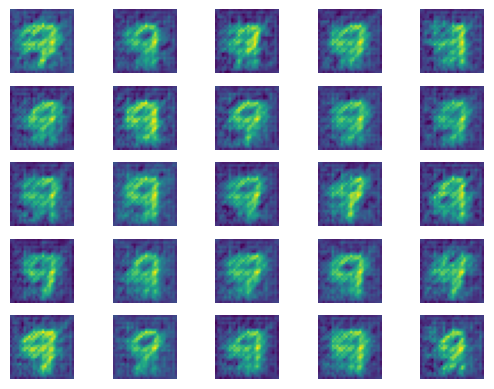

############### train denoiser_3/4 ###############
Epoch 1/30
20/20 [==============================] - 5s 35ms/step - loss: 0.1081
Epoch 2/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0701
Epoch 3/30
20/20 [==============================] - 1s 37ms/step - loss: 0.0437
Epoch 4/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0358
Epoch 5/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0312
Epoch 6/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0285
Epoch 7/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0272
Epoch 8/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0278
Epoch 9/30
20/20 [==============================] - 1s 36ms/step - loss: 0.0262
Epoch 10/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0254
Epoch 11/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0250
Epoch 12/30
20/20 [==============================] - 1s 34ms/step -

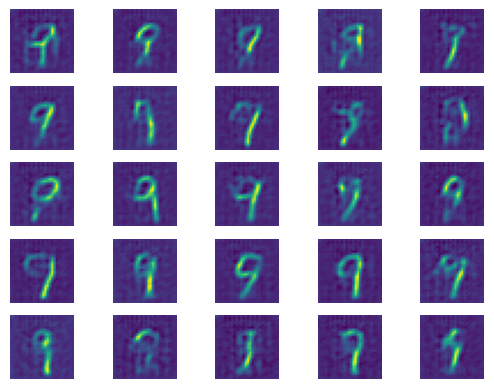

############### train denoiser_4/4 ###############
Epoch 1/30
20/20 [==============================] - 7s 36ms/step - loss: 0.0712
Epoch 2/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0216
Epoch 3/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0139
Epoch 4/30
20/20 [==============================] - 1s 34ms/step - loss: 0.0116
Epoch 5/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0105
Epoch 6/30
20/20 [==============================] - 1s 34ms/step - loss: 0.0100
Epoch 7/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0096
Epoch 8/30
20/20 [==============================] - 1s 34ms/step - loss: 0.0088
Epoch 9/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0084
Epoch 10/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0081
Epoch 11/30
20/20 [==============================] - 1s 35ms/step - loss: 0.0078
Epoch 12/30
20/20 [==============================] - 1s 35ms/step -

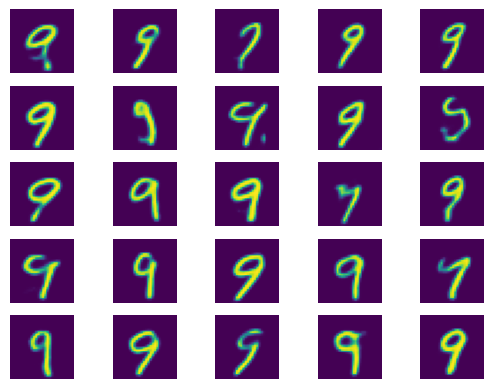

2/2 [==============================] - 1s 155ms/step
noise prediction


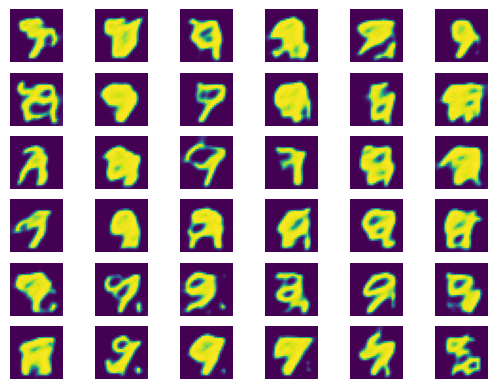

############################################################################
############################################################################
####################                             ###########################
####################    second step, digit 9     ###########################
####################                             ###########################
############################################################################
############################################################################

############### train connection layers ###############
2/2 [==============================] - 0s 15ms/step
noise prediction


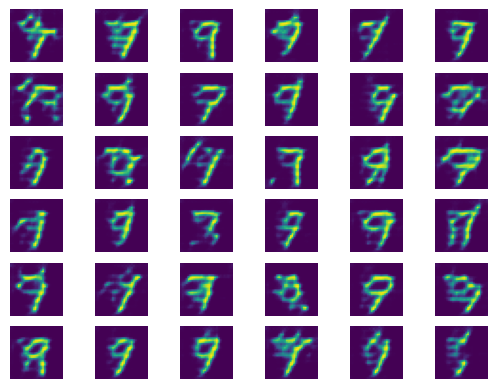

2/2 [==============================] - 0s 24ms/step
noise prediction


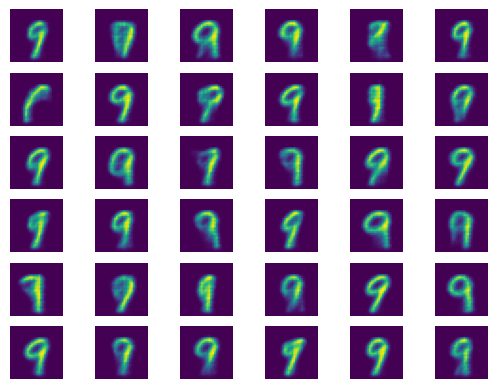

20/20 [==============================] - 3s 157ms/step - loss: 0.0464
############################################################################
############################################################################
####################                             ###########################
####################     third step, digit 9     ###########################
####################                             ###########################
############################################################################
############################################################################

############### train full gan_model ###############
2/2 [==============================] - 0s 15ms/step
noise prediction


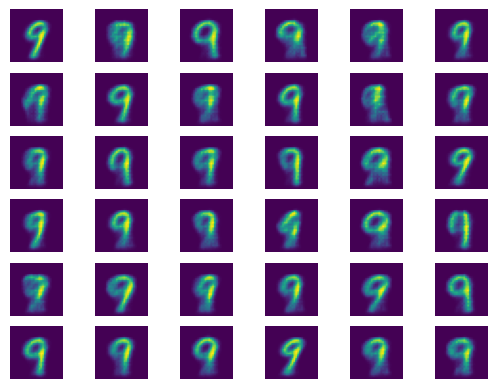

2/2 [==============================] - 0s 18ms/step
noise prediction


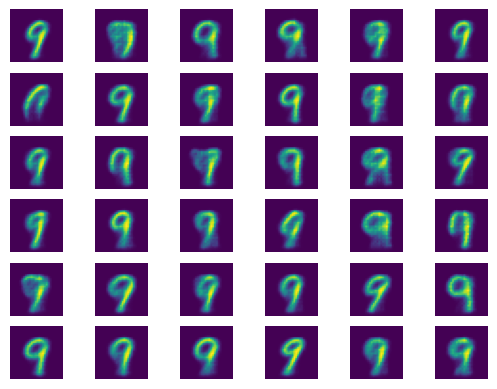

2/2 [==============================] - 0s 17ms/step
noise prediction


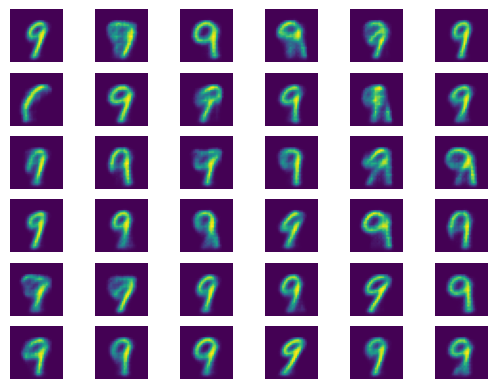

2/2 [==============================] - 0s 19ms/step
noise prediction


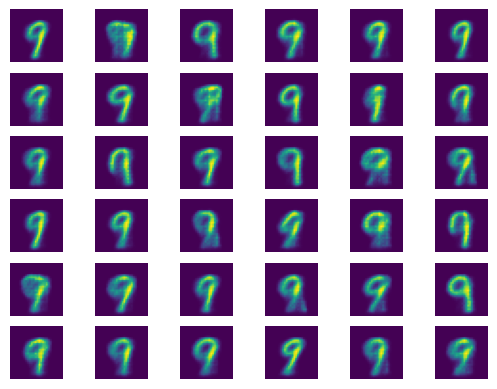

20/20 [==============================] - 3s 155ms/step - loss: 0.0445


In [8]:
for digit in range(9, 10):
    models = list_of_models[digit]
    models_con = list_of_con_models[digit]
    gan_model = list_of_gans[digit]
    datasets = __datasets__[digit]
    b = np.random.randn(36 * 28 * 28 * 1)
    b = b.reshape(36, 28, 28, 1)
    print('#####################################\n'
          '#                                   #\n'
          f'#    train gan model for digit {digit}    #\n'
          '#                                   #\n'
          '#####################################\n')

    print('############################################################################\n'
          '############################################################################\n'
          '####################                             ###########################\n'
          f'####################     first step, digit {digit}     ###########################\n'
          '####################                             ###########################\n'
          '############################################################################\n'
          '############################################################################\n')
    for i in range(steps):
        # define data in current epoch
        data = datasets[steps - i]
        # define target in current epoch
        target = datasets[steps - i - 1]

        if i != 0:
            # train denoiser number i
            print(f'############### train denoiser_{i + 1}/{len(models)} ###############')
            models[i].fit(data, target, epochs=epochs, batch_size=batch_size)
            #train layers which will connect 2 denoiser models
            print(f'############### train model to connect denoiser_{i + 1} and denoiser_{i} ###############')
            # define variable gan
            gan_model_per = Sequential([
                Input(shape=(28, 28, 1)),
            ])
            # construct gan
            models[i - 1].trainable = False
            gan_model_per.add(models[i - 1])
            gan_model_per.add(models_con[i - 1])
            models[i].trainable = False
            gan_model_per.add(models[i])
            # compile and train variable gan
            gan_model_per.compile(loss='mse', optimizer='adam')
            gan_model_per.fit(data, target, epochs=epochs, batch_size=batch_size)
            # add gan_model pretrained layer
            gan_model.add(models_con[i - 1])
            gan_model.add(models[i])
            # look at losses
            print(f'gan_model summary: {gan_model.summary()} /ngan_model_per summary: {gan_model_per.summary()}')
            show_images(gan_model_per.predict(data_pr), 5)
        # condition for the first epoch
        else:
            print(f'############### train denoiser_{i + 1}/{len(models)} ###############')
            # train first denoiser
            models[i].fit(data, target, epochs=epochs, batch_size=batch_size)
            gan_model.add(models[i])
        data_pr = data.copy()


    # compile
    gan_model.compile(loss='mse', optimizer='adam')
    # look at result
    pred = gan_model.predict(b)
    print('noise prediction')
    show_images(pred, 6)
    #save
    gan_model.save_weights(base_path + f'1_denoiser_weights_{digit}.h5')
    gan_model.save(base_path + f'1_denoiser_model_{digit}.h5')

    print('############################################################################\n'
          '############################################################################\n'
          '####################                             ###########################\n'
          f'####################    second step, digit {digit}     ###########################\n'
          '####################                             ###########################\n'
          '############################################################################\n'
          '############################################################################\n')
    # make denoisers non-trainable
    for i in range(steps):
        models[i].trainable = False
    # train conncetion layers
    print('############### train connection layers ###############')
    for i in range(epochs * 2):
        gan_model.fit(datasets[-1], datasets[0], epochs=1, batch_size=batch_size)
        if i % epochs == 0:
            # look at results
            pred = gan_model.predict(b)
            print('noise prediction')
            show_images(pred, 6)
        elif i == 0:
            pass
    #save
    gan_model.save_weights(base_path + f'2_denoiser_weights_{digit}.h5')
    gan_model.save(base_path + f'2_denoiser_model_{digit}.h5')


    print('############################################################################\n'
          '############################################################################\n'
          '####################                             ###########################\n'
          f'####################     third step, digit {digit}     ###########################\n'
          '####################                             ###########################\n'
          '############################################################################\n'
          '############################################################################\n')
    # final training with
    print('############### train full gan_model ###############')
    # make denoisers trainable
    for i in range(steps):
        models[i].trainable = True
    # train full gan_model
    for i in range(epochs * 5):
        gan_model.fit(datasets[-1], datasets[0], epochs=1, batch_size=batch_size)
        if i == 0:
            pass
        elif i % epochs == 0:
            # look at results
            pred = gan_model.predict(b)
            print('noise prediction')
            show_images(pred, 6)

    #save
    gan_model.save_weights(base_path + f'3_denoiser_weights_{digit}.h5')
    gan_model.save(base_path + f'3_denoiser_model_{digit}.h5')

    __list_of_gans__.append(gan_model)

## - Saving model weights

In [ ]:
gan_model.save_weights(base_path + 'final_denoiser_gan_weights.h5')
gan_model.save(base_path + 'final_denoiser_gan.h5')

# Using

## - Import

In [ ]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
from PIL import Image
import random
import io
import imageio

from tensorflow import keras
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, LeakyReLU, Dropout, Input, Conv2DTranspose, Layer, Concatenate, UpSampling2D, Flatten, Dense
from keras.initializers import RandomNormal
from keras.models import Sequential, Model, load_model
from keras.datasets import mnist
from keras.optimizers import Adam, RMSprop
from keras.applications import VGG19

import warnings
warnings.filterwarnings("ignore")

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## - Constants

In [ ]:
steps = 4
list_of_models = []
list_of_con_models = []
__list_of_gans__ = []
base_path = 'drive/MyDrive/weights_for_denoiser/'

## - Input

In [15]:
print('please write a prompt separating the words with a space')
#prompt = str(input())
prompt = '021324354657687980'

please write a prompt separating the words with a space


## - Weights loading and fast model creation

### -- fast model creation

In [17]:
# define denoiser
def create_denoiser():
    model = Sequential([
        Input(shape=(28, 28, 1)),
        Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (3, 3), activation='relu', padding='same'),

        Conv2DTranspose(64, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(64, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(128, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(1, (7, 7), padding='same', activation='sigmoid'),
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# create list of denoisers
for i in range(10):
    models = [create_denoiser() for _ in range(steps)]
    list_of_models.append(models)

list_of_models = np.stack(list_of_models)
list_of_models[0][0].summary()
print(f'shape list_of_models: {list_of_models.shape}')

Model: "sequential_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_420 (Conv2D)         (None, 14, 14, 128)       2176      
                                                                 
 batch_normalization_280 (Ba  (None, 14, 14, 128)      512       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_280 (LeakyReLU)  (None, 14, 14, 128)      0         
                                                                 
 dropout_140 (Dropout)       (None, 14, 14, 128)       0         
                                                                 
 conv2d_421 (Conv2D)         (None, 7, 7, 64)          131136    
                                                                 
 batch_normalization_281 (Ba  (None, 7, 7, 64)         256       
 tchNormalization)                                   

In [18]:
# define connection layers
def create_connection_layers():
    connection = Sequential([
        Input(shape=(28, 28, 1)),
        Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        LeakyReLU(alpha=0.2),
        Dropout(0.5),

        Conv2D(64, (3, 3), activation='relu', padding='same'),

        Conv2DTranspose(128, (4, 4), strides=(2,2), padding='same', kernel_initializer=RandomNormal(mean=0.0, stddev=0.02)),
        BatchNormalization(trainable=True),
        Conv2D(64, (3, 3), padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(1, (7, 7), padding='same', activation='sigmoid'),
    ])
    return connection

#create list of connection layers
for i in range(10):
    models = [create_denoiser() for _ in range(steps - 1)]
    list_of_con_models.append(models)

list_of_con_models = np.stack(list_of_con_models)
list_of_con_models[0][0].summary()
print(f'shape list_of_con_models: {list_of_con_models.shape}')

Model: "sequential_120"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_660 (Conv2D)         (None, 14, 14, 128)       2176      
                                                                 
 batch_normalization_440 (Ba  (None, 14, 14, 128)      512       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_440 (LeakyReLU)  (None, 14, 14, 128)      0         
                                                                 
 dropout_220 (Dropout)       (None, 14, 14, 128)       0         
                                                                 
 conv2d_661 (Conv2D)         (None, 7, 7, 64)          131136    
                                                                 
 batch_normalization_441 (Ba  (None, 7, 7, 64)         256       
 tchNormalization)                                  

In [19]:
for digit in range(10):
    models = list_of_models[digit]
    models_con = list_of_con_models[digit]
    for i in range(steps):
        models[i].trainable = True
    gan_model = Sequential([Input(shape=(28, 28, 1))])
    gan_model.add(models[0])

    for i in range(1, steps):
        gan_model.add(models_con[i - 1])
        gan_model.add(models[i])

    gan_model.compile(loss='mse', optimizer='adam')
    gan_model.summary
    __list_of_gans__.append(gan_model)

In [20]:
__list_of_gans__[0].summary()

Model: "sequential_150"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_80 (Sequential)  (None, 28, 28, 1)         559361    
                                                                 
 sequential_120 (Sequential)  (None, 28, 28, 1)        559361    
                                                                 
 sequential_81 (Sequential)  (None, 28, 28, 1)         559361    
                                                                 
 sequential_121 (Sequential)  (None, 28, 28, 1)        559361    
                                                                 
 sequential_82 (Sequential)  (None, 28, 28, 1)         559361    
                                                                 
 sequential_122 (Sequential)  (None, 28, 28, 1)        559361    
                                                                 
 sequential_83 (Sequential)  (None, 28, 28, 1)      

### -- Loading weights

In [21]:
base_path = 'drive/MyDrive/weights_for_denoiser/'
for digit in range(10):
    __list_of_gans__[digit].load_weights(base_path + f'3_denoiser_weights_{digit}.h5')

## - Prompt

In [22]:
possible_prompts = {
    '__list_of_gans__[0]': ['0', 'zero'],
    '__list_of_gans__[1]': ['1', 'one'],
    '__list_of_gans__[2]': ['2', 'two'],
    '__list_of_gans__[3]': ['3', 'three'],
    '__list_of_gans__[4]': ['4', 'four'],
    '__list_of_gans__[5]': ['5', 'five'],
    '__list_of_gans__[6]': ['6', 'six'],
    '__list_of_gans__[7]': ['7', 'seven'],
    '__list_of_gans__[8]': ['8', 'eight'],
    '__list_of_gans__[9]': ['9', 'nine']}
if prompt.count(' ') != 0:
    prompt = prompt.split(' ')

curent_models = []
for i in prompt:
    for key, values in possible_prompts.items():
        if i in values:
            curent_models.append(eval(key))

## - Predictions

1/1 [==============================] - 0s 100ms/step


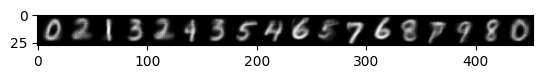

In [27]:
b = np.random.randn(1 * 28 * 28 * 1)
b = b.reshape(1, 28, 28, 1)
samples = np.array([curent_models[0].predict(b)]).reshape(28, 28, 1)
for i in range(1, len(curent_models)):
    b = np.random.randn(1 * 28 * 28 * 1)
    b = b.reshape(1, 28, 28, 1)
    prediction = curent_models[i].predict(b)[0]
    prediction = prediction[:, 2:27]
    samples = np.concatenate((samples, prediction), axis=1)
samples
plt.imshow(samples, cmap='gray')